# 安徽安庆市项目`WRF-CMAQ`模拟分析
## 模拟结果分析：*`Integrated Source Apportionment Method`*

---
*@author: Evan*\
*@date: 2023-05-10*

In [1]:
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os

from matplotlib import rcParams
config = {
    "font.family":'Times New Roman',
    "mathtext.fontset":'stix',
    "font.serif": ['SimSun'],
}
rcParams.update(config)

# silence the warning note
import warnings
warnings.filterwarnings("ignore")

import cartopy.crs as ccrs
import cartopy.feature as cfeat
from cartopy.io.shapereader import Reader

## 读取数据

In [2]:
isam = xr.open_dataset('F:/Data/case_anqing/April/April_ISAM2.nc')
metFile=xr.open_dataset('F:/Data/case_anqing/April/April_met.nc')

lat = metFile.latitude
lon = metFile.longitude

uw_L1=np.squeeze(metFile.uwind.sel(level=1000,method='nearest'))
vw_L1=np.squeeze(metFile.vwind.sel(level=1000,method='nearest'))


In [3]:
# 计算L1和L2两层平均数据
# 获取需要遍历的变量列表和相应的变量名称列表
var_list = [isam.PM25_AQ, isam.PM25_HF, isam.PM25_TL, isam.PM25_CZ, 
            isam.PM25_JJ, isam.PM25_OTH, isam.PM25_ICO, isam.PM25_BCO]
name_list = ['AQ', 'HF', 'TL', 'CZ', 'JJ', 'OTH', 'ICO', 'BCO']

# 初始化 L1 和 L2 变量字典
L1_dict = {}
L2_dict = {}

for i, var in enumerate(var_list):
    # 在 L1 字典中存储 L1 变量
    L1_dict[f"{name_list[i]}_L1"] = np.mean(var[:,:4,:,:], axis=1)
    
    # 在 L2 字典中存储 L2 变量
    L2_dict[f"{name_list[i]}_L2"] = np.mean(var[:,4:19,:,:], axis=1)

# 解包 L1 和 L2 字典，将变量重新赋值给原始变量名称
AQ_L1, HF_L1, TL_L1, CZ_L1, JJ_L1, OTH_L1, ICO_L1, BCO_L1 = L1_dict.values()
AQ_L2, HF_L2, TL_L2, CZ_L2, JJ_L2, OTH_L2, ICO_L2, BCO_L2 = L2_dict.values()

In [4]:
AQ_L1.shape

(720, 138, 135)

## 画图

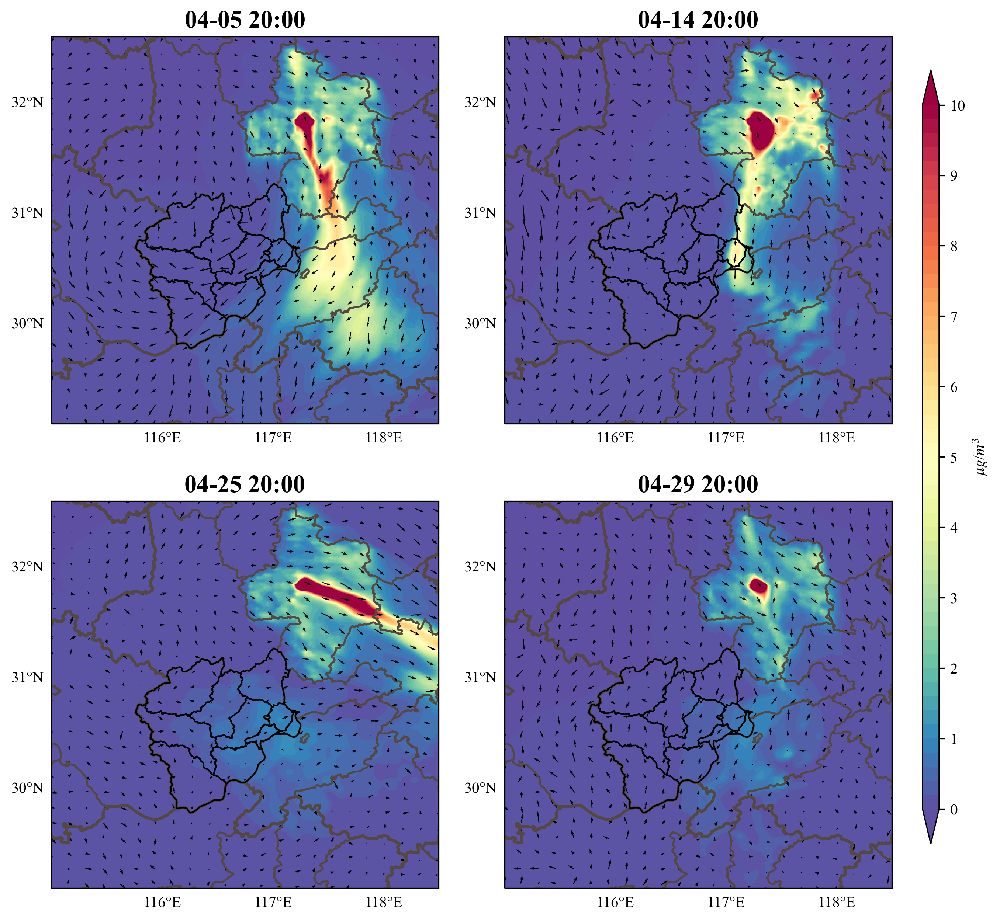

In [11]:
date  = np.array([[5,14],[25,29]])
hour  = 20
tstep = (date-1)*24+hour-1

cmax=10.1
cmaplevel=np.arange(0,cmax,0.2)
proj=ccrs.PlateCarree()

xgrid=np.size(uw_L1,2)
ygrid=np.size(uw_L1,1)
ngrid=5

fig = plt.figure(figsize=(10,10),dpi=300)
ax = fig.subplots(2,2,subplot_kw={'projection':proj})

shp_aq = Reader('F:/Data/case_anqing/shapefile/Anqing_district/anqing_district.shp')
shp_pro = Reader('F:/shapefile/shp_for_ArcGis/ChinaAdminDivisonSHP-master/2. Province/province.shp')
shp_cit = Reader('F:/shapefile/shp_for_ArcGis/ChinaAdminDivisonSHP-master/3. City/city.shp')
for i in range(2):
    for j in range(2):
        ax[i][j].add_feature(cfeat.ShapelyFeature(shp_pro.geometries(),proj,edgecolor='#554741',facecolor='None'), linewidth=1.8)
        ax[i][j].add_feature(cfeat.ShapelyFeature(shp_cit.geometries(),proj,edgecolor='#554741',facecolor='None'), linewidth=1.2)
        ax[i][j].add_feature(cfeat.ShapelyFeature(shp_aq.geometries(),proj,edgecolor='k',facecolor='None'), linewidth=1)

        gl=ax[i][j].gridlines(
            xlocs=np.arange(-180, 180 + 1, 1), ylocs=np.arange(-90, 90 + 1, 1),
            draw_labels=True, x_inline=False, y_inline=False,
            linewidth=0, linestyle='--', color='gray')
        gl.top_labels = False
        gl.right_labels =False
        gl.rotate_labels=False

        ax[i][j].set_extent([115., 118.5, 29.1, 32.6],ccrs.PlateCarree())
        
        # contour map
        cp=ax[i][j].contourf(lon,lat,HF_L1[tstep[i][j],:,:],transform=proj,cmap='Spectral_r',levels=cmaplevel,extend='both')

        # wind quiver
        ax[i][j].quiver(lon[0:ygrid:ngrid,0:xgrid:ngrid],lat[0:ygrid:ngrid,0:xgrid:ngrid],
                uw_L1[tstep[i][j],0:ygrid:ngrid,0:xgrid:ngrid],vw_L1[tstep[i][j],0:ygrid:ngrid,0:xgrid:ngrid],
                transform=proj,color='k',alpha=1,scale=150,headwidth=3)
        
        ax[i][j].set_title(pd.to_datetime('2023-04-'+str(date[i][j])+'T'+str(hour)).strftime('%m-%d %H:%M'),weight='bold',size=16)

# share colorbar
fig.subplots_adjust(right=0.9,wspace=0.12)
position= fig.add_axes([0.92,0.15,0.015,0.7])
cbar=fig.colorbar(cp,cax=position)
cbar.set_ticks(np.arange(0,cmax+0.1,1))
cbar.set_label('$\mu$$g$/$m^3$')

# plt.suptitle('O$_3$ from Hefei',size=20)
plt.show()

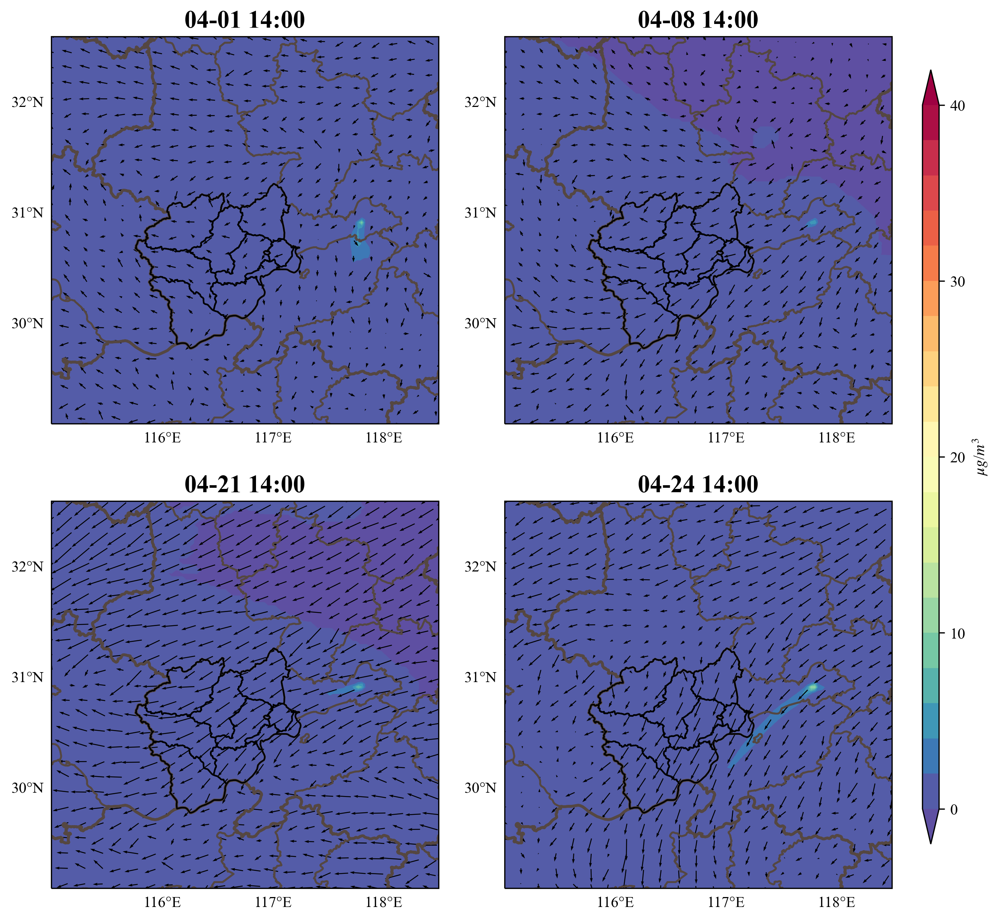

In [6]:
date  = np.array([[1,8],[21,24]])
hour  = 14
tstep = (date-1)*24+hour-1

cmax=41
cmaplevel=np.arange(0,cmax,2)
proj=ccrs.PlateCarree()

xgrid=np.size(uw_L1,2)
ygrid=np.size(uw_L1,1)
ngrid=5

fig = plt.figure(figsize=(10,10),dpi=300)
ax = fig.subplots(2,2,subplot_kw={'projection':proj})

shp_aq = Reader('F:/Data/case_anqing/shapefile/Anqing_district/anqing_district.shp')
shp_pro = Reader('F:/shapefile/shp_for_ArcGis/ChinaAdminDivisonSHP-master/2. Province/province.shp')
shp_cit = Reader('F:/shapefile/shp_for_ArcGis/ChinaAdminDivisonSHP-master/3. City/city.shp')
for i in range(2):
    for j in range(2):
        ax[i][j].add_feature(cfeat.ShapelyFeature(shp_pro.geometries(),proj,edgecolor='#554741',facecolor='None'), linewidth=1.8)
        ax[i][j].add_feature(cfeat.ShapelyFeature(shp_cit.geometries(),proj,edgecolor='#554741',facecolor='None'), linewidth=1.2)
        ax[i][j].add_feature(cfeat.ShapelyFeature(shp_aq.geometries(),proj,edgecolor='k',facecolor='None'), linewidth=1)

        gl=ax[i][j].gridlines(
            xlocs=np.arange(-180, 180 + 1, 1), ylocs=np.arange(-90, 90 + 1, 1),
            draw_labels=True, x_inline=False, y_inline=False,
            linewidth=0, linestyle='--', color='gray')
        gl.top_labels = False
        gl.right_labels =False
        gl.rotate_labels=False

        ax[i][j].set_extent([115., 118.5, 29.1, 32.6],ccrs.PlateCarree())
        
        # contour map
        cp=ax[i][j].contourf(lon,lat,TL_L1[tstep[i][j],:,:],transform=proj,cmap='Spectral_r',levels=cmaplevel,extend='both')

        # wind quiver
        ax[i][j].quiver(lon[0:ygrid:ngrid,0:xgrid:ngrid],lat[0:ygrid:ngrid,0:xgrid:ngrid],
                uw_L1[tstep[i][j],0:ygrid:ngrid,0:xgrid:ngrid],vw_L1[tstep[i][j],0:ygrid:ngrid,0:xgrid:ngrid],
                transform=proj,color='k',alpha=1,scale=150,headwidth=3)
        
        ax[i][j].set_title(pd.to_datetime('2023-04-'+str(date[i][j])+'T'+str(hour)).strftime('%m-%d %H:%M'),weight='bold',size=16)

# share colorbar
fig.subplots_adjust(right=0.9,wspace=0.12)
position= fig.add_axes([0.92,0.15,0.015,0.7])
cbar=fig.colorbar(cp,cax=position)
cbar.set_ticks(np.arange(0,cmax+1,10))
cbar.set_label('$\mu$$g$/$m^3$')

# plt.suptitle('O$_3$ from Hefei',size=20)
plt.show()

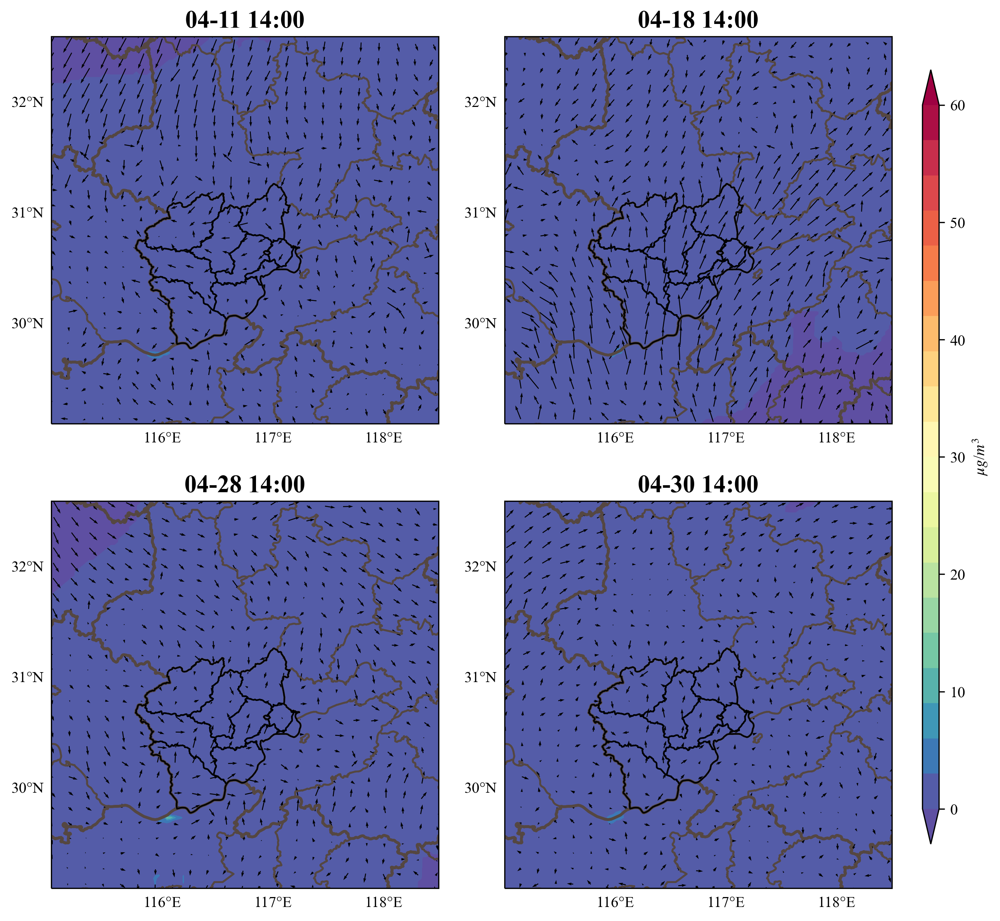

In [7]:
date  = np.array([[11,18],[28,30]])
hour  = 14
tstep = (date-1)*24+hour-1

cmax=61
cmaplevel=np.arange(0,cmax,3)
proj=ccrs.PlateCarree()

xgrid=np.size(uw_L1,2)
ygrid=np.size(uw_L1,1)
ngrid=5

fig = plt.figure(figsize=(10,10),dpi=300)
ax = fig.subplots(2,2,subplot_kw={'projection':proj})

shp_aq = Reader('F:/Data/case_anqing/shapefile/Anqing_district/anqing_district.shp')
shp_pro = Reader('F:/shapefile/shp_for_ArcGis/ChinaAdminDivisonSHP-master/2. Province/province.shp')
shp_cit = Reader('F:/shapefile/shp_for_ArcGis/ChinaAdminDivisonSHP-master/3. City/city.shp')
for i in range(2):
    for j in range(2):
        ax[i][j].add_feature(cfeat.ShapelyFeature(shp_pro.geometries(),proj,edgecolor='#554741',facecolor='None'), linewidth=1.8)
        ax[i][j].add_feature(cfeat.ShapelyFeature(shp_cit.geometries(),proj,edgecolor='#554741',facecolor='None'), linewidth=1.2)
        ax[i][j].add_feature(cfeat.ShapelyFeature(shp_aq.geometries(),proj,edgecolor='k',facecolor='None'), linewidth=1)

        gl=ax[i][j].gridlines(
            xlocs=np.arange(-180, 180 + 1, 1), ylocs=np.arange(-90, 90 + 1, 1),
            draw_labels=True, x_inline=False, y_inline=False,
            linewidth=0, linestyle='--', color='gray')
        gl.top_labels = False
        gl.right_labels =False
        gl.rotate_labels=False

        ax[i][j].set_extent([115., 118.5, 29.1, 32.6],ccrs.PlateCarree())
        
        # contour map
        cp=ax[i][j].contourf(lon,lat,JJ_L1[tstep[i][j],:,:],transform=proj,cmap='Spectral_r',levels=cmaplevel,extend='both')

        # wind quiver
        ax[i][j].quiver(lon[0:ygrid:ngrid,0:xgrid:ngrid],lat[0:ygrid:ngrid,0:xgrid:ngrid],
                uw_L1[tstep[i][j],0:ygrid:ngrid,0:xgrid:ngrid],vw_L1[tstep[i][j],0:ygrid:ngrid,0:xgrid:ngrid],
                transform=proj,color='k',alpha=1,scale=150,headwidth=3)
        
        ax[i][j].set_title(pd.to_datetime('2023-04-'+str(date[i][j])+'T'+str(hour)).strftime('%m-%d %H:%M'),weight='bold',size=16)

# share colorbar
fig.subplots_adjust(right=0.9,wspace=0.12)
position= fig.add_axes([0.92,0.15,0.015,0.7])
cbar=fig.colorbar(cp,cax=position)
cbar.set_ticks(np.arange(0,cmax+1,10))
cbar.set_label('$\mu$$g$/$m^3$')

# plt.suptitle('O$_3$ from Hefei',size=20)
plt.show()

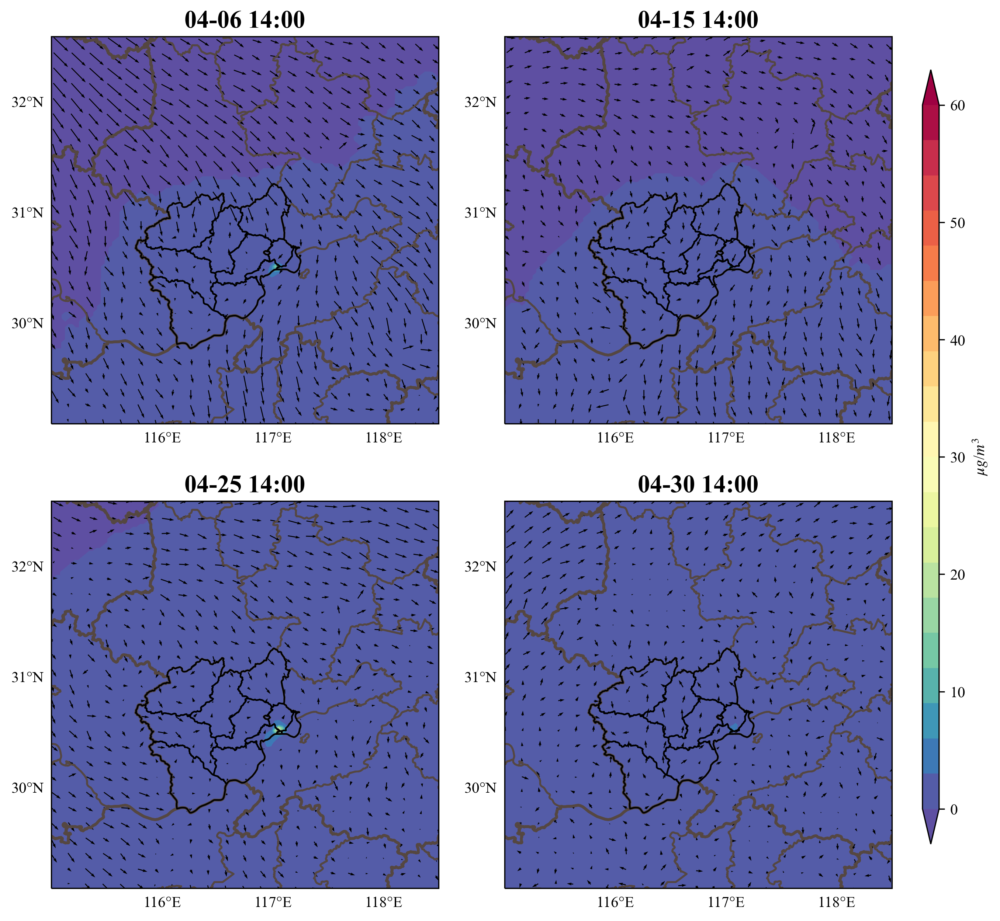

In [8]:
date  = np.array([[6,15],[25,30]])
hour  = 14
tstep = (date-1)*24+hour-1

cmax=61
cmaplevel=np.arange(0,cmax,3)
proj=ccrs.PlateCarree()

xgrid=np.size(uw_L1,2)
ygrid=np.size(uw_L1,1)
ngrid=5

fig = plt.figure(figsize=(10,10),dpi=300)
ax = fig.subplots(2,2,subplot_kw={'projection':proj})

shp_aq = Reader('F:/Data/case_anqing/shapefile/Anqing_district/anqing_district.shp')
shp_pro = Reader('F:/shapefile/shp_for_ArcGis/ChinaAdminDivisonSHP-master/2. Province/province.shp')
shp_cit = Reader('F:/shapefile/shp_for_ArcGis/ChinaAdminDivisonSHP-master/3. City/city.shp')
for i in range(2):
    for j in range(2):
        ax[i][j].add_feature(cfeat.ShapelyFeature(shp_pro.geometries(),proj,edgecolor='#554741',facecolor='None'), linewidth=1.8)
        ax[i][j].add_feature(cfeat.ShapelyFeature(shp_cit.geometries(),proj,edgecolor='#554741',facecolor='None'), linewidth=1.2)
        ax[i][j].add_feature(cfeat.ShapelyFeature(shp_aq.geometries(),proj,edgecolor='k',facecolor='None'), linewidth=1)

        gl=ax[i][j].gridlines(
            xlocs=np.arange(-180, 180 + 1, 1), ylocs=np.arange(-90, 90 + 1, 1),
            draw_labels=True, x_inline=False, y_inline=False,
            linewidth=0, linestyle='--', color='gray')
        gl.top_labels = False
        gl.right_labels =False
        gl.rotate_labels=False

        ax[i][j].set_extent([115., 118.5, 29.1, 32.6],ccrs.PlateCarree())
        
        # contour map
        cp=ax[i][j].contourf(lon,lat,AQ_L1[tstep[i][j],:,:],transform=proj,cmap='Spectral_r',levels=cmaplevel,extend='both')

        # wind quiver
        ax[i][j].quiver(lon[0:ygrid:ngrid,0:xgrid:ngrid],lat[0:ygrid:ngrid,0:xgrid:ngrid],
                uw_L1[tstep[i][j],0:ygrid:ngrid,0:xgrid:ngrid],vw_L1[tstep[i][j],0:ygrid:ngrid,0:xgrid:ngrid],
                transform=proj,color='k',alpha=1,scale=150,headwidth=3)
        
        ax[i][j].set_title(pd.to_datetime('2023-04-'+str(date[i][j])+'T'+str(hour)).strftime('%m-%d %H:%M'),weight='bold',size=16)

# share colorbar
fig.subplots_adjust(right=0.9,wspace=0.12)
position= fig.add_axes([0.92,0.15,0.015,0.7])
cbar=fig.colorbar(cp,cax=position)
cbar.set_ticks(np.arange(0,cmax+1,10))
cbar.set_label('$\mu$$g$/$m^3$')

# plt.suptitle('O$_3$ from Hefei',size=20)
plt.show()

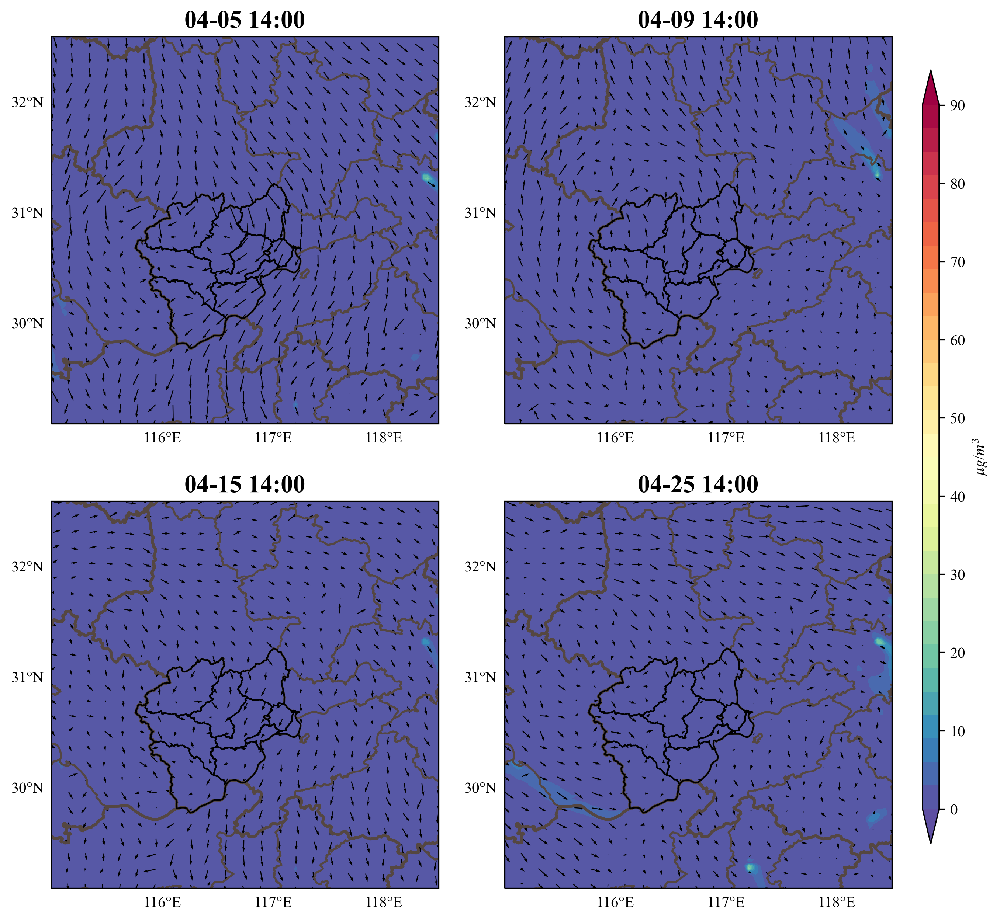

In [9]:
date  = np.array([[5,9],[15,25]])
hour  = 14
tstep = (date-1)*24+hour-1

cmax=91
cmaplevel=np.arange(0,cmax,3)
proj=ccrs.PlateCarree()

xgrid=np.size(uw_L1,2)
ygrid=np.size(uw_L1,1)
ngrid=5

fig = plt.figure(figsize=(10,10),dpi=300)
ax = fig.subplots(2,2,subplot_kw={'projection':proj})

shp_aq = Reader('F:/Data/case_anqing/shapefile/Anqing_district/anqing_district.shp')
shp_pro = Reader('F:/shapefile/shp_for_ArcGis/ChinaAdminDivisonSHP-master/2. Province/province.shp')
shp_cit = Reader('F:/shapefile/shp_for_ArcGis/ChinaAdminDivisonSHP-master/3. City/city.shp')
for i in range(2):
    for j in range(2):
        ax[i][j].add_feature(cfeat.ShapelyFeature(shp_pro.geometries(),proj,edgecolor='#554741',facecolor='None'), linewidth=1.8)
        ax[i][j].add_feature(cfeat.ShapelyFeature(shp_cit.geometries(),proj,edgecolor='#554741',facecolor='None'), linewidth=1.2)
        ax[i][j].add_feature(cfeat.ShapelyFeature(shp_aq.geometries(),proj,edgecolor='k',facecolor='None'), linewidth=1)

        gl=ax[i][j].gridlines(
            xlocs=np.arange(-180, 180 + 1, 1), ylocs=np.arange(-90, 90 + 1, 1),
            draw_labels=True, x_inline=False, y_inline=False,
            linewidth=0, linestyle='--', color='gray')
        gl.top_labels = False
        gl.right_labels =False
        gl.rotate_labels=False

        ax[i][j].set_extent([115., 118.5, 29.1, 32.6],ccrs.PlateCarree())
        
        # contour map
        cp=ax[i][j].contourf(lon,lat,OTH_L1[tstep[i][j],:,:],transform=proj,cmap='Spectral_r',levels=cmaplevel,extend='both')

        # wind quiver
        ax[i][j].quiver(lon[0:ygrid:ngrid,0:xgrid:ngrid],lat[0:ygrid:ngrid,0:xgrid:ngrid],
                uw_L1[tstep[i][j],0:ygrid:ngrid,0:xgrid:ngrid],vw_L1[tstep[i][j],0:ygrid:ngrid,0:xgrid:ngrid],
                transform=proj,color='k',alpha=1,scale=150,headwidth=3)
        
        ax[i][j].set_title(pd.to_datetime('2023-04-'+str(date[i][j])+'T'+str(hour)).strftime('%m-%d %H:%M'),weight='bold',size=16)

# share colorbar
fig.subplots_adjust(right=0.9,wspace=0.12)
position= fig.add_axes([0.92,0.15,0.015,0.7])
cbar=fig.colorbar(cp,cax=position)
cbar.set_ticks(np.arange(0,cmax+1,10))
cbar.set_label('$\mu$$g$/$m^3$')

# plt.suptitle('O$_3$ from Hefei',size=20)
plt.show()

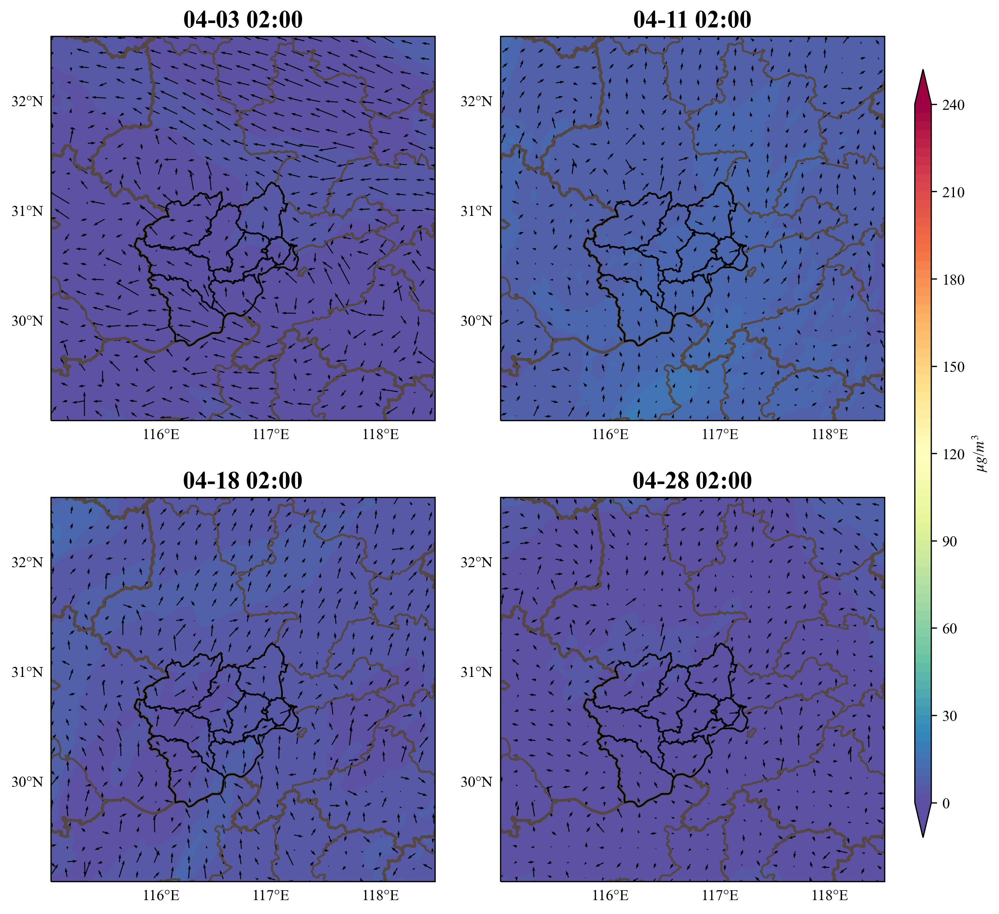

In [10]:
date  = np.array([[3,11],[18,28]])
hour  = 2
tstep = (date-1)*24+hour-1

cmax=241
cmaplevel=np.arange(0,cmax,3)
proj=ccrs.PlateCarree()

xgrid=np.size(uw_L1,2)
ygrid=np.size(uw_L1,1)
ngrid=5

fig = plt.figure(figsize=(10,10),dpi=300)
ax = fig.subplots(2,2,subplot_kw={'projection':proj})

shp_aq = Reader('F:/Data/case_anqing/shapefile/Anqing_district/anqing_district.shp')
shp_pro = Reader('F:/shapefile/shp_for_ArcGis/ChinaAdminDivisonSHP-master/2. Province/province.shp')
shp_cit = Reader('F:/shapefile/shp_for_ArcGis/ChinaAdminDivisonSHP-master/3. City/city.shp')
for i in range(2):
    for j in range(2):
        ax[i][j].add_feature(cfeat.ShapelyFeature(shp_pro.geometries(),proj,edgecolor='#554741',facecolor='None'), linewidth=1.8)
        ax[i][j].add_feature(cfeat.ShapelyFeature(shp_cit.geometries(),proj,edgecolor='#554741',facecolor='None'), linewidth=1.2)
        ax[i][j].add_feature(cfeat.ShapelyFeature(shp_aq.geometries(),proj,edgecolor='k',facecolor='None'), linewidth=1)

        gl=ax[i][j].gridlines(
            xlocs=np.arange(-180, 180 + 1, 1), ylocs=np.arange(-90, 90 + 1, 1),
            draw_labels=True, x_inline=False, y_inline=False,
            linewidth=0, linestyle='--', color='gray')
        gl.top_labels = False
        gl.right_labels =False
        gl.rotate_labels=False

        ax[i][j].set_extent([115., 118.5, 29.1, 32.6],ccrs.PlateCarree())
        
        # contour map
        cp=ax[i][j].contourf(lon,lat,BCO_L1[tstep[i][j],:,:],transform=proj,cmap='Spectral_r',levels=cmaplevel,extend='both')

        # wind quiver
        ax[i][j].quiver(lon[0:ygrid:ngrid,0:xgrid:ngrid],lat[0:ygrid:ngrid,0:xgrid:ngrid],
                uw_L1[tstep[i][j],0:ygrid:ngrid,0:xgrid:ngrid],vw_L1[tstep[i][j],0:ygrid:ngrid,0:xgrid:ngrid],
                transform=proj,color='k',alpha=1,scale=150,headwidth=3)
        
        ax[i][j].set_title(pd.to_datetime('2023-04-'+str(date[i][j])+'T'+str(hour).zfill(2)).strftime('%m-%d %H:%M'),weight='bold',size=16)

# share colorbar
fig.subplots_adjust(right=0.9,wspace=0.12)
position= fig.add_axes([0.92,0.15,0.015,0.7])
cbar=fig.colorbar(cp,cax=position)
cbar.set_ticks(np.arange(0,cmax+1,30))
cbar.set_label('$\mu$$g$/$m^3$')

# plt.suptitle('O$_3$ from Hefei',size=20)
plt.show()